I want to create a CRNN testing utility

I have csv file containing two columns "file_name" and "digit". I have a folder called "digits" containing 200000 image files of images of digits.

I want to create the train and test datasets and crnn model

Can you provide the steps and code for this please

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os

import sys
sys.path.append("../project_functions/")
import ad_functions as adfns
import ad_crnn_functions as adcrn


import pandas as pd
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import (
    Input, 
    Conv2D, 
    MaxPooling2D, 
    Reshape, 
    Bidirectional, 
    LSTM, 
    Dense, 
    BatchNormalization, 
    Dropout, 
    Softmax, 
    Flatten
)


## Load the Dataset

In [3]:
data = pd.read_csv('bw_600k_created_files.csv')

In [7]:
# Load the dataset and split it into train and test sets
def load_images(file_names):
    images = []
    for file_name in file_names:
        print(file_name)
        full_path_image = ("./digits_600k/"+file_name+".png")
        # print(full_path_image)
        # image = cv2.imread(os.path.join('./bw_digits', file_name, '.png'), cv2.IMREAD_GRAYSCALE)
        image = cv2.imread(full_path_image, cv2.IMREAD_GRAYSCALE)
        image = cv2.resize(image, (32, 32))
        image = np.expand_dims(image, axis=-1)
        images.append(image)
    return np.array(images)


In [8]:

X = load_images(data['filename'].values)
y = data['digit'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


VUhSHCD5_0
q3uOBRr5_0
i8rVtuqh_0
VyiqNGUJ_0
2W5KCOe5_0
ik5xiaxS_0
cVJkdNzG_0
6DRX7mPw_0
t8qZPdn5_0
MuUaYc5i_0
CAynjCG3_0
9GE2v2Mw_0
24Q9qxkC_0
YjnRsf87_0
uJpH9L2R_0
Xtn8XdL2_0
DPzzuiOO_0
FkH3qZhn_0
sDlreAv6_0
YNyD4TPh_0
ZwXKFOa3_0
mjL1cViI_0
DrDG1nWw_0
f9e71piD_0
pFoOSB4E_0
Vl44fBw2_0
aF9vkLdS_0
EUTtCeYU_0
flJx4ZhK_0
fGWcfYuJ_0
j4Od4doJ_0
O2hiFDeI_0
up1vD11F_0
ZzCaVpu8_0
ZlGB1rVF_0
fu9qdZ15_0
d7Jse8TG_0
OPK2xPno_0
hRKBKsFJ_0
cJ4lJUou_0
iaZBL1Kp_0
Th7IBLTh_0
DqluaQ5E_0
Kqr47hOR_0
KpsaYuGo_0
Lsd0Np2B_0
dwIXhWsa_0
8ZAthBPL_0
buwvlwdk_0
Fkgs2rQJ_0
Sr0b6tsc_0
ldNQn98m_0
hh3zNNG7_0
4QIW8TG3_0
1EtDm7BO_0
tY4s9QCY_0
G2eS3XKl_0
nSyvKF5G_0
09ptxFak_0
y1fFs2m5_0
2Ci7osj3_0
t6Ijh43f_0
Mr3y8mcF_0
d4o2oV62_0
sLJogrCd_0
LwM0T2zp_0
Xhoqvjvg_0
UEH6nHVM_0
bBrH38Ar_0
OcTB1vBF_0
RzXbvmTm_0
KWWq1fOB_0
hTyXtSh0_0
IPZPk1pR_0
u4ERZhSR_0
qd5ip5GQ_0
OR4bU6Oq_0
ApR0gR7a_0
gblqgiFX_0
Zsu4pMEo_0
Wl3LoEGW_0
ygbaqCbR_0
CQwhIIIx_0
fzTdQpNR_0
K5AuMDME_0
CXNx6XkV_0
84E9bS5H_0
xzPrQMAT_0
9H3Xi5Cn_0
L3ENfFIB_0
c7xCocug_0

## Normalize images


In [9]:
X_train = X_train / 255.0
X_test = X_test / 255.0

## One-hot encode labels


In [10]:
y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)

## Define the CRNN model

In [11]:

# Create the model
def create_crnn_model(input_shape, num_classes):
    inputs = Input(input_shape)

    # Convolutional layers
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    # Reshape for LSTM
    x = Reshape(target_shape=((8, 8*64)))(x)

    # Bidirectional LSTM layers
    x = Bidirectional(LSTM(128, return_sequences=True))(x)
    x = Bidirectional(LSTM(128))(x)

    # Dense layer for classification
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

In [7]:
# def create_crnn_model(
#     input_shape=(32, 32, 3), num_digits=5, num_classes=11, learning_rate=1e-4
# ):
#     input_layer = Input(shape=input_shape)

#     x = Conv2D(32, (3, 3), activation="relu", padding="same")(input_layer)
#     x = BatchNormalization()(x)
#     x = MaxPooling2D((2, 2))(x)

#     x = Conv2D(64, (3, 3), activation="relu", padding="same")(x)
#     x = BatchNormalization()(x)
#     x = MaxPooling2D((2, 2))(x)

#     x = Conv2D(128, (3, 3), activation="relu", padding="same")(x)
#     x = BatchNormalization()(x)
#     x = MaxPooling2D((2, 2))(x)

#     x = Flatten()(x)
#     x = Dense(512, activation="relu")(x)
#     x = BatchNormalization()(x)
#     x = Dropout(0.5)(x)

#     x = Dense(num_classes * num_digits, activation="linear")(x)
#     x = Reshape((num_digits, num_classes))(x)
#     x = Softmax(axis=-1)(x)

#     model = Model(inputs=input_layer, outputs=x)
#     model.compile(
#         optimizer=Adam(learning_rate=learning_rate),
#         loss="categorical_crossentropy",
#         metrics=["accuracy"],
#     )

#     return model


In [12]:
input_shape = (32, 32, 1)
num_classes = 10

crnn_model = create_crnn_model(input_shape, num_classes)

## Train the CRNN model


In [13]:
crnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


batch_size = 64
epochs = 25

history = crnn_model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_test, y_test))


Epoch 1/25
7500/7500 [==============================] - 101s 13ms/step - loss: 0.0092 - accuracy: 0.9969 - val_loss: 8.3439e-07 - val_accuracy: 1.0000
Epoch 2/25
7500/7500 [==============================] - 85s 11ms/step - loss: 2.0360e-07 - accuracy: 1.0000 - val_loss: 6.8814e-09 - val_accuracy: 1.0000
Epoch 3/25
7500/7500 [==============================] - 96s 13ms/step - loss: 5.9443e-09 - accuracy: 1.0000 - val_loss: 8.4092e-09 - val_accuracy: 1.0000
Epoch 4/25
7500/7500 [==============================] - 97s 13ms/step - loss: 0.0300 - accuracy: 0.9924 - val_loss: 3.1641e-05 - val_accuracy: 1.0000
Epoch 5/25
7500/7500 [==============================] - 121s 16ms/step - loss: 7.7219e-06 - accuracy: 1.0000 - val_loss: 7.1292e-07 - val_accuracy: 1.0000
Epoch 6/25
7500/7500 [==============================] - 119s 16ms/step - loss: 1.9059e-07 - accuracy: 1.0000 - val_loss: 3.4930e-08 - val_accuracy: 1.0000
Epoch 7/25
7500/7500 [==============================] - 148s 20ms/step - loss: 3.

Evaluation and Analysis

The output you provided shows the training progress of a deep learning model over 25 epochs. I will evaluate and analyze the results based on the provided information.

Loss and accuracy values: The model's performance is determined by two primary metrics, loss and accuracy. The loss metric is a measure of the model's error, with lower values indicating better performance. The accuracy metric represents the percentage of correct predictions made by the model.

Training and validation data: The model is trained on a dataset and validated on a separate dataset to assess its generalization performance. The training data is used to update the model's weights, while the validation data is used to evaluate the model's performance on unseen data.

Analysis:

From Epoch 1 to Epoch 3, the model's loss and accuracy on both training and validation data improve significantly. The loss decreases, and the accuracy reaches 100% for both training and validation datasets. This might indicate that the model has learned the underlying patterns in the data effectively.

However, from Epoch 4 onwards, there is some fluctuation in the loss values. For example, in Epoch 4, the training loss increases to 0.0300, but in the following epochs, it decreases again. A similar pattern is seen in Epoch 8, 16, and 22, where the loss increases but then decreases in the subsequent epochs. This could be due to the model learning and generalizing better as it trains, but it could also be an indication of some noise in the data or overfitting.

Despite the fluctuations in the loss values, the model maintains a 100% accuracy on the validation dataset throughout the training process. This is an exceptional result, but it could also be a sign of overfitting, as the model might be too specialized in the training data and might not perform as well on new, unseen data. It is essential to test the model on a separate test dataset to confirm its true generalization performance.

In conclusion, the model appears to have learned the underlying patterns in the training data quite well, achieving 100% accuracy on both training and validation datasets. However, the fluctuations in loss values, especially on the training data, should be investigated further to ensure that the model is not overfitting. Additionally, it is crucial to evaluate the model's performance on a separate test dataset to confirm its true generalization capabilities.

In [14]:

# Test the CRNN model
score = crnn_model.evaluate(X_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

3750/3750 [==============================] - 28s 7ms/step - loss: 5.3294e-08 - accuracy: 1.0000
Test loss: 5.329350116767273e-08
Test accuracy: 1.0


## Save the Model

In [15]:
model_file = "CRNN_digits_model_bw_600k.h5"
crnn_model.save(model_file)

## Load the Model

In [3]:
# from tensorflow.keras.models import load_model
model_file = "CRNN_digits_model_bw_600k.h5"
crnn_model = load_model(model_file)

## Testing the Model against SIPA 09 Cropped

In [28]:
def preprocess_digit_gray(digit_image, target_size=(32, 32)):
    digit_image = cv2.resize(digit_image, target_size)
    digit_image = cv2.cvtColor(digit_image, cv2.COLOR_RGB2GRAY)
    digit_image = digit_image.astype("float32") / 255.0
    digit_image = np.expand_dims(digit_image, axis=-1)
    digit_image = np.expand_dims(digit_image, axis=0)
    return digit_image

(300, 1182)


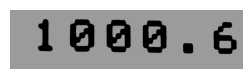

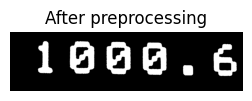

1/1 [==============================] - 3s 3s/step
[[2.9624731e-04 1.1142182e-05 4.9733685e-06 4.6243554e-04 7.6925680e-06
  4.9409293e-02 7.1332060e-08 9.4980270e-01 5.2570940e-06 1.2678341e-07]]


In [5]:
image_path = "./cropped_images/9/S09_F03_Cropped.png"

img = cv2.imread(image_path)
img = adfns.invert_thresh(img)
print(img.shape)
adfns.show_img(img, 3)


preprocess_image = adcrn.preprocess_image(img)

adfns.show_img(preprocess_image, 3, title="After preprocessing")

digit_images = adcrn.extract_digits(preprocess_image)
predictions = []

# preprocessed_digit_b = preprocess_digit_gray(digit_images[0])
preprocessed_digit_a = adcrn.preprocess_digit(digit_images[0])

prediction = crnn_model.predict(preprocessed_digit_a)

print(prediction)


In [26]:
print(preprocessed_digit.shape)

(1, 32, 32, 3)


(247, 726)


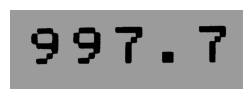

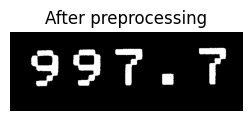

1/1 [==============================] - 0s 15ms/step
Predicted number: 55578
[5, 5, 5, 7, 8]


In [21]:
image_path = "./cropped_images/9/S09_F01_Cropped.png"

img = cv2.imread(image_path)
img = adfns.invert_thresh(img)
print(img.shape)
adfns.show_img(img, 3)

preprocess_image = adcrn.preprocess_image(img)

adfns.show_img(preprocess_image, 3, title="After preprocessing")

digit_images = adcrn.extract_digits(preprocess_image)
predictions = []

for digit_image in digit_images:
    preprocessed_digit = adcrn.preprocess_digit(digit_image)
    prediction = crnn_model.predict(preprocessed_digit)
    # print(prediction)
    digit_prediction = np.argmax(prediction)
    # print("Predicted digit:", digit_prediction)
    predictions.append(digit_prediction)

print("Predicted number:", ''.join(map(str, predictions)))
print(predictions)

## Analyse a prediction

(247, 726)


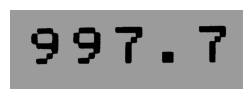

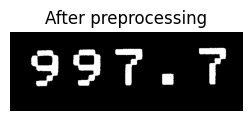

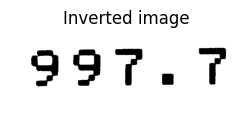

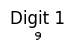

(1, 32, 32, 1)
1/1 [==============================] - 0s 22ms/step
Predicted digit: 2
sorted_indices: [[6 9 7 1 8 3 4 0 5 2]]


IndexError: index 6 is out of bounds for axis 0 with size 1

In [20]:
image_path = "./cropped_images/9/S09_F01_Cropped.png"

img = cv2.imread(image_path)
img = adfns.invert_thresh(img)
print(img.shape)
adfns.show_img(img, 3)

preprocess_image = adcrn.preprocess_image(img)

adfns.show_img(preprocess_image, 3, title="After preprocessing")
inverted_image = cv2.bitwise_not(preprocess_image)
adfns.show_img(inverted_image, 3, title="Inverted image")

digit_images = adcrn.extract_digits_bow(inverted_image)


adfns.show_img(digit_images[0], size=.1, title="Digit 1")

preprocessed_digit = adcrn.preprocess_digit(digit_image[0])
# adfns.show_img(preprocessed_digit, size=.1, title="Digit 1")
print(preprocessed_digit.shape)
prediction = crnn_model.predict(preprocessed_digit)

digit_prediction = np.argmax(prediction)
print("Predicted digit:", digit_prediction)

sorted_indices = np.argsort(prediction)[::-1]
print("sorted_indices:", sorted_indices)
n = 2  # You can choose a different value for n depending on your requirements
top_n_indices = sorted_indices[:n]
top_n_probabilities = prediction[top_n_indices]


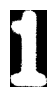

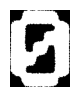

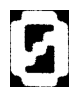

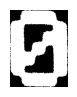

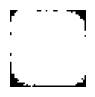

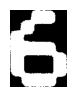

In [17]:
for digit_image in digit_images:
    adfns.show_img(digit_image, 1)

In [13]:
def ad_process_and_predict_digits(crnn_model, directory_path):
    file_list = os.listdir(directory_path)

    for file_name in file_list:
        image_path = os.path.join(directory_path, file_name)
        img = cv2.imread(image_path)
        img = adfns.invert_thresh(img)
        print(img.shape)
        adfns.show_img(img, 3)

        preprocess_image = adcrn.preprocess_image(img)

        adfns.show_img(preprocess_image, 3, title="After preprocessing")

        inverted_image = cv2.bitwise_not(preprocess_image)

        adfns.show_img(inverted_image, 3, title="Inverted")


        digit_images = adcrn.extract_digits_bow(inverted_image)
        predictions = []

        for digit_image in digit_images:
            adfns.show_img(digit_image, 1)
            preprocessed_digit = adcrn.preprocess_digit(digit_image)
            prediction = crnn_model.predict(preprocessed_digit)
            digit_prediction = np.argmax(prediction)
            predictions.append(digit_prediction)

        print("Predicted number:", "".join(map(str, predictions)))
        print(predictions)


(247, 726)


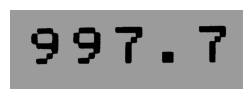

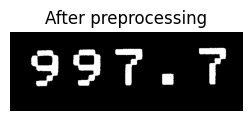

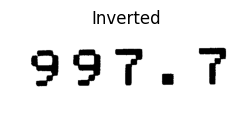

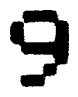

1/1 [==============================] - 0s 18ms/step


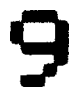

1/1 [==============================] - 0s 17ms/step


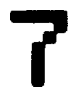

1/1 [==============================] - 0s 18ms/step


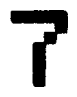

1/1 [==============================] - 0s 17ms/step
Predicted number: 9977
[9, 9, 7, 7]
(275, 696)


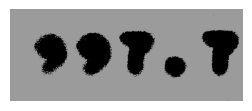

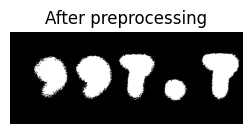

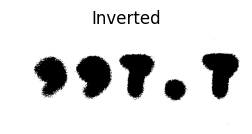

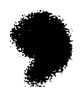

1/1 [==============================] - 0s 18ms/step


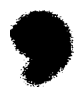

1/1 [==============================] - 0s 17ms/step


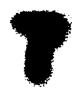

1/1 [==============================] - 0s 21ms/step


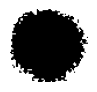

1/1 [==============================] - 0s 18ms/step


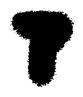

1/1 [==============================] - 0s 17ms/step
Predicted number: 99909
[9, 9, 9, 0, 9]
(300, 1182)


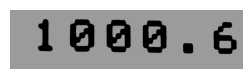

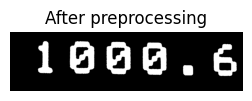

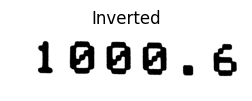

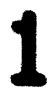

1/1 [==============================] - 0s 16ms/step


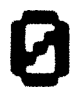

1/1 [==============================] - 0s 16ms/step


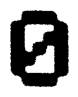

1/1 [==============================] - 0s 18ms/step


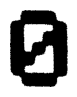

1/1 [==============================] - 0s 18ms/step


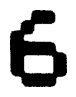

1/1 [==============================] - 0s 20ms/step
Predicted number: 10008
[1, 0, 0, 0, 8]
(484, 1236)


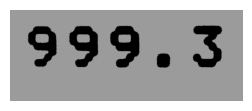

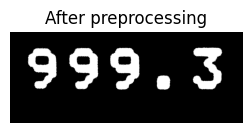

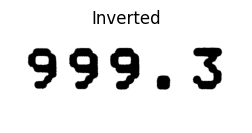

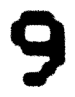

1/1 [==============================] - 0s 20ms/step


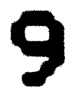

1/1 [==============================] - 0s 18ms/step


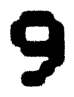

1/1 [==============================] - 0s 16ms/step


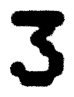

1/1 [==============================] - 0s 19ms/step
Predicted number: 9993
[9, 9, 9, 3]
(272, 844)


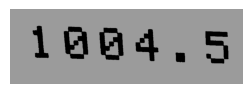

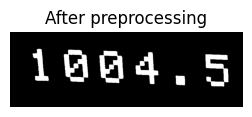

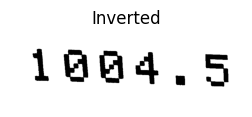

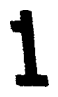

1/1 [==============================] - 0s 16ms/step


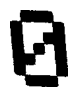

1/1 [==============================] - 0s 21ms/step


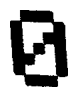

1/1 [==============================] - 0s 20ms/step


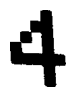

1/1 [==============================] - 0s 17ms/step


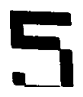

1/1 [==============================] - 0s 17ms/step
Predicted number: 10045
[1, 0, 0, 4, 5]
(223, 761)


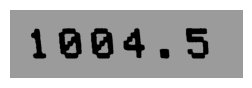

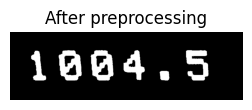

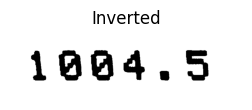

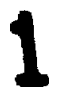

1/1 [==============================] - 0s 27ms/step


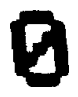

1/1 [==============================] - 0s 20ms/step


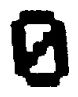

1/1 [==============================] - 0s 18ms/step


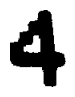

1/1 [==============================] - 0s 18ms/step


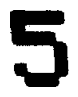

1/1 [==============================] - 0s 18ms/step
Predicted number: 10045
[1, 0, 0, 4, 5]
(178, 586)


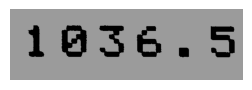

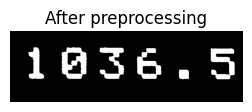

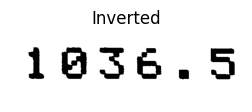

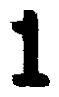

1/1 [==============================] - 0s 19ms/step


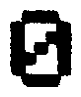

1/1 [==============================] - 0s 18ms/step


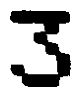

1/1 [==============================] - 0s 18ms/step


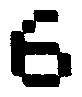

1/1 [==============================] - 0s 20ms/step


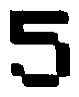

1/1 [==============================] - 0s 19ms/step
Predicted number: 10365
[1, 0, 3, 6, 5]
(285, 1081)


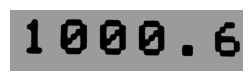

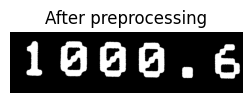

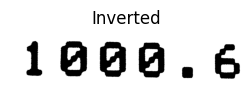

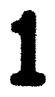

1/1 [==============================] - 0s 19ms/step


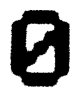

1/1 [==============================] - 0s 21ms/step


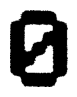

1/1 [==============================] - 0s 18ms/step


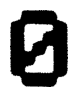

1/1 [==============================] - 0s 18ms/step


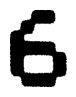

1/1 [==============================] - 0s 16ms/step
Predicted number: 10008
[1, 0, 0, 0, 8]
(273, 709)


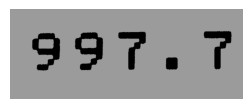

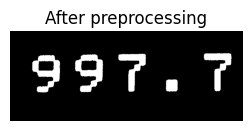

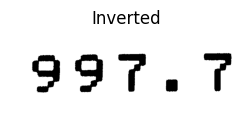

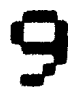

1/1 [==============================] - 0s 18ms/step


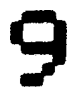

1/1 [==============================] - 0s 17ms/step


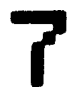

1/1 [==============================] - 0s 17ms/step


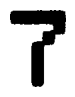

1/1 [==============================] - 0s 18ms/step
Predicted number: 9977
[9, 9, 7, 7]
(202, 594)


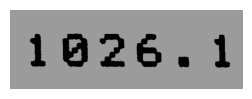

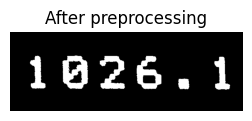

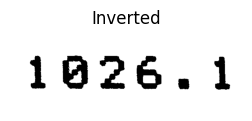

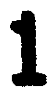

1/1 [==============================] - 0s 17ms/step


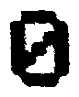

1/1 [==============================] - 0s 18ms/step


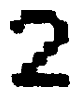

1/1 [==============================] - 0s 28ms/step


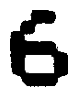

1/1 [==============================] - 0s 20ms/step


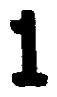

1/1 [==============================] - 0s 16ms/step
Predicted number: 10281
[1, 0, 2, 8, 1]
(162, 628)


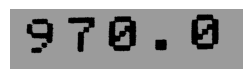

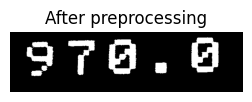

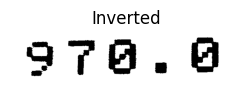

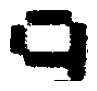

1/1 [==============================] - 0s 16ms/step


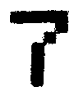

1/1 [==============================] - 0s 17ms/step


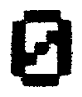

1/1 [==============================] - 0s 21ms/step


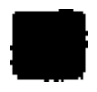

1/1 [==============================] - 0s 17ms/step


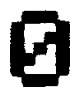

1/1 [==============================] - 0s 17ms/step
Predicted number: 41020
[4, 1, 0, 2, 0]
(200, 614)


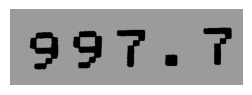

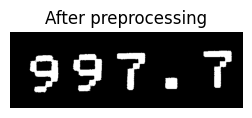

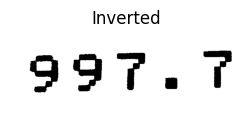

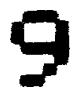

1/1 [==============================] - 0s 17ms/step


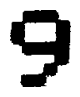

1/1 [==============================] - 0s 19ms/step


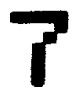

1/1 [==============================] - 0s 17ms/step


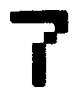

1/1 [==============================] - 0s 19ms/step
Predicted number: 9911
[9, 9, 1, 1]
(227, 775)


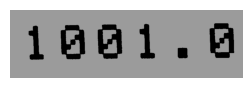

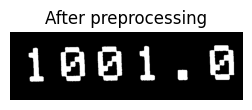

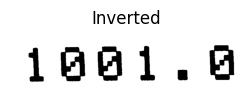

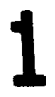

1/1 [==============================] - 0s 22ms/step


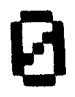

1/1 [==============================] - 0s 18ms/step


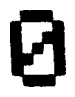

1/1 [==============================] - 0s 17ms/step


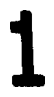

1/1 [==============================] - 0s 17ms/step


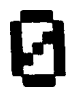

1/1 [==============================] - 0s 18ms/step
Predicted number: 10010
[1, 0, 0, 1, 0]
(333, 793)


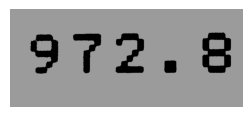

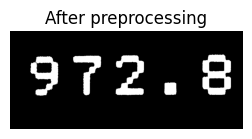

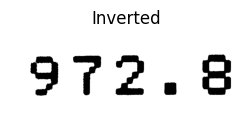

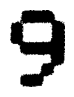

1/1 [==============================] - 0s 17ms/step


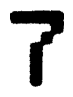

1/1 [==============================] - 0s 17ms/step


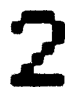

1/1 [==============================] - 0s 19ms/step


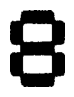

1/1 [==============================] - 0s 17ms/step
Predicted number: 9128
[9, 1, 2, 8]
(182, 623)


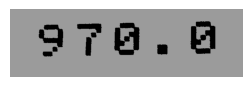

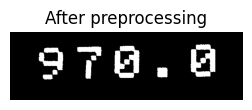

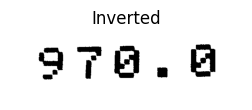

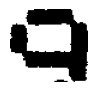

1/1 [==============================] - 0s 18ms/step


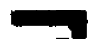

1/1 [==============================] - 0s 22ms/step


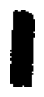

1/1 [==============================] - 0s 19ms/step


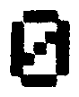

1/1 [==============================] - 0s 17ms/step


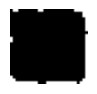

1/1 [==============================] - 0s 19ms/step


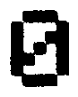

1/1 [==============================] - 0s 17ms/step
Predicted number: 842020
[8, 4, 2, 0, 2, 0]
(214, 674)


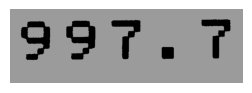

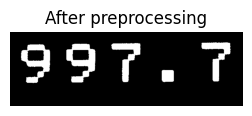

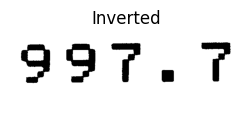

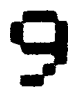

1/1 [==============================] - 0s 20ms/step


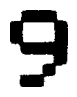

1/1 [==============================] - 0s 19ms/step


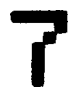

1/1 [==============================] - 0s 19ms/step


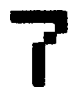

1/1 [==============================] - 0s 23ms/step
Predicted number: 9971
[9, 9, 7, 1]
(192, 535)


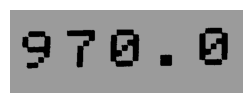

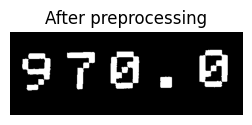

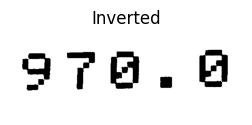

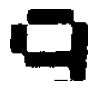

1/1 [==============================] - 0s 18ms/step


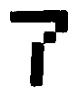

1/1 [==============================] - 0s 17ms/step


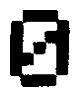

1/1 [==============================] - 0s 19ms/step


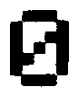

1/1 [==============================] - 0s 22ms/step
Predicted number: 8100
[8, 1, 0, 0]
(211, 694)


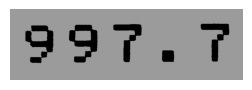

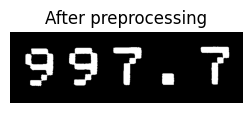

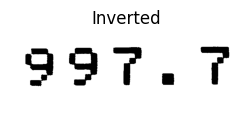

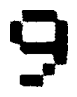

1/1 [==============================] - 0s 16ms/step


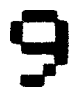

1/1 [==============================] - 0s 21ms/step


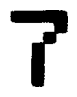

1/1 [==============================] - 0s 18ms/step


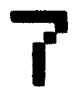

1/1 [==============================] - 0s 17ms/step
Predicted number: 9977
[9, 9, 7, 7]
(211, 601)


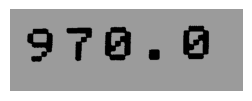

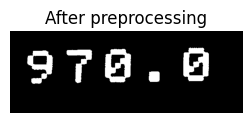

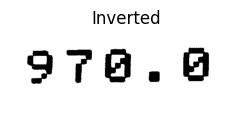

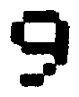

1/1 [==============================] - 0s 21ms/step


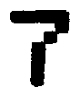

1/1 [==============================] - 0s 17ms/step


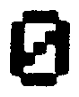

1/1 [==============================] - 0s 17ms/step


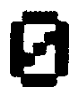

1/1 [==============================] - 0s 19ms/step
Predicted number: 9100
[9, 1, 0, 0]
(184, 589)


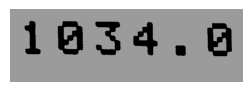

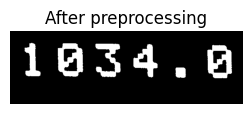

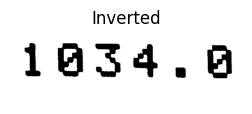

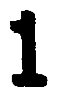

1/1 [==============================] - 0s 20ms/step


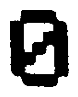

1/1 [==============================] - 0s 18ms/step


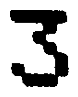

1/1 [==============================] - 0s 19ms/step


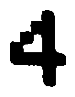

1/1 [==============================] - 0s 17ms/step


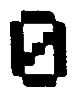

1/1 [==============================] - 0s 19ms/step
Predicted number: 10340
[1, 0, 3, 4, 0]


In [16]:
ad_process_and_predict_digits(crnn_model, "./cropped_images/9/")